### **Customer Segmentation** 
#### Using Unsupervised Machine Learning Algo.
---

**Problem Definition:**  
> Identify consumer segments based on customer purchase behavior, demographic, and marketing campaign response. Targeted marketing efforts will help the company to optimize product-market fit and efficiently utilize resources.

**Stakeholders:** 
> Marketing Campaign Team, Customer base, Product Development Team, Data Analytics Team.

**Objective:** 
> Identify 4 consumer segments with descriptive insights on purchasing behavior and marketing campaign response.

**Workflow**: Python, Jupyter Notebook.
> **Modules:** Pandas, Scikit-learn, Plotnine (ggplot), Yellowbrick, Feature-engine

### 🗺 Navigate

*Exploratory Data Analysis*
* [Data Discovery](#Data-Discovery)
* [Visualization](#Visualization)

*Feature Selection*
* [Feature Engineering](#Feature-Engineering)

*Preprocessing*
* [Pipeline](#Pipeline)

*Clustering*
* [Clustering](#Clustering)

### 🥧 Dataset

The dataset is sourced from: https://www.kaggle.com/datasets/vishakhdapat/customer-segmentation-clustering
and in it contains: 
> Demographic features such as: Birth Year, Income, Age, Offspring(Kid, Teenager)

> Administrative features such as : Id, Date of Enrollment

> Purchasing Behavior such as: Recency, Purchase (Deals, Catalog, Store), Compaint, Response, Amount Spent.

#### Feature description


|Feature| Description|
|-------|------------|
| Id | Unique identifier for each individual in the dataset |
| Year_Birth | The birth year of the individual |
| Education | The highest level of education attained by the individual |
| Marital_Status | The marital status of the individual |
| Income | The annual income of the individual |
| Kidhome | The number of young children in the household |
| Teenhome | The number of teenagers in the household |
| Dt_Customer | The date when the customer was first enrolled or became a part of the company's database |
| Recency | The number of days since the last purchase or interaction |
| MntWines | The amount spent on wines |
| MntFruits | The amount spent on fruits |
| MntMeatProducts | The amount spent on meat products |
| MntFishProducts | The amount spent on fish products |
| MntSweetProducts | The amount spent on sweet products |
| MntGoldProds | The amount spent on gold products |
| NumDealsPurchases | The number of purchases made with a discount or as part of a deal |
| NumWebPurchases | The number of purchases made through the company's website |
| NumCatalogPurchases | The number of purchases made through catalogs |
| NumStorePurchases | The number of purchases made in physical stores |
| NumWebVisitsMonth | The number of visits to the company's website in a month |
| AcceptedCmp3 | Binary indicator (1 or 0) whether the individual accepted the third marketing campaign |
| AcceptedCmp4 | Binary indicator (1 or 0) whether the individual accepted the fourth marketing campaign |
| AcceptedCmp5 | Binary indicator (1 or 0) whether the individual accepted the fifth marketing campaign |
| AcceptedCmp1 | Binary indicator (1 or 0) whether the individual accepted the first marketing campaign |
| AcceptedCmp2 | Binary indicator (1 or 0) whether the individual accepted the second marketing campaign |
| Complain | Binary indicator (1 or 0) whether the individual has made a complaint |
| Z_CostContact | A constant cost associated with contacting a customer |
| Z_Revenue | A constant revenue associated with a successful campaign response |
| Response | Binary indicator (1 or 0) whether the individual responded to the marketing campaign |


#### Requirements

In [1]:
with open('requirements.txt', 'w') as t:
    t.write("yellowbrick feature_engine pingouin pyjanitor plotnine pandas numpy patchworklib")

### Import Modules

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
import re
import pandas as pd
import numpy as np
from itertools import pairwise
from pandas.core.common import flatten
import janitor

import matplotlib.pyplot as plt
from plotnine import *
from mizani.formatters import *

import pingouin as pg
from feature_engine.datetime import DatetimeFeatures
from feature_engine.imputation import MeanMedianImputer
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from scipy.cluster.hierarchy import dendrogram, linkage

from yellowbrick.cluster import (
    KElbowVisualizer, 
    SilhouetteVisualizer, 
    InterclusterDistance
)

from feature_engine.pipeline import Pipeline
from feature_engine.wrappers import SklearnTransformerWrapper
from feature_engine.encoding import OneHotEncoder

import patchworklib as pw


pd.options.display.max_columns = 30

<Figure size 100x100 with 0 Axes>

In [4]:
# plotting parameters for plotnine
COLOR = {"light_blue": "#d0e2ff", "mid_blue": "#4589ff", "dark_blue": "#0f62fe"}
CAT_COLOR = ["#1192e8", "#fa4d56", "#002d9c", "#009d9a", "#a56eff", "#005d5d", "#570408"]

# title parameters
plot_title_params = dict(size=14, family = 'Calibri', weight='normal', margin={'b': 1})

# subtitle parameters
plot_subtitle_params = dict(size=10, weight='ultralight', family='Calibri')

# text style and size parameters
custom_font_theme_params = dict(
        axis_text_x=element_text(size=7),
        axis_text_y=element_text(size=7),
        axis_title_x=element_text(size=8),
        axis_title_y=element_text(size=8),
        plot_title=element_text(**plot_title_params),
        plot_subtitle=element_text(**plot_subtitle_params))

## Data Discovery

In [5]:
# load dataframe
customer_df = pd.read_csv('customer_segmentation.csv').clean_names(case_type='snake')

In [6]:
# check first 10 entries in the dataframe
customer_df.head(10)

,id,year_birth,education,marital_status,income,kidhome,teenhome,dt_customer,recency,mnt_wines,mnt_fruits,mnt_meat_products,mnt_fish_products,mnt_sweet_products,mnt_gold_prods,num_deals_purchases,num_web_purchases,num_catalog_purchases,num_store_purchases,num_web_visits_month,accepted_cmp3,accepted_cmp4,accepted_cmp5,accepted_cmp1,accepted_cmp2,complain,z_cost_contact,z_revenue,response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0
5,7446,1967,Master,Together,62513.0,0,1,09-09-2013,16,520,42,98,0,42,14,2,6,4,10,6,0,0,0,0,0,0,3,11,0
6,965,1971,Graduation,Divorced,55635.0,0,1,13-11-2012,34,235,65,164,50,49,27,4,7,3,7,6,0,0,0,0,0,0,3,11,0
7,6177,1985,PhD,Married,33454.0,1,0,08-05-2013,32,76,10,56,3,1,23,2,4,0,4,8,0,0,0,0,0,0,3,11,0
8,4855,1974,PhD,Together,30351.0,1,0,06-06-2013,19,14,0,24,3,3,2,1,3,0,2,9,0,0,0,0,0,0,3,11,1
9,5899,1950,PhD,Together,5648.0,1,1,13-03-2014,68,28,0,6,1,1,13,1,1,0,0,20,1,0,0,0,0,0,3,11,0


#### Missing Data

In [7]:
# We have a total of 24 missing entries in our dataset
customer_df.isna().sum()

id                        0
year_birth                0
education                 0
marital_status            0
income                   24
kidhome                   0
teenhome                  0
dt_customer               0
recency                   0
mnt_wines                 0
mnt_fruits                0
mnt_meat_products         0
mnt_fish_products         0
mnt_sweet_products        0
mnt_gold_prods            0
num_deals_purchases       0
num_web_purchases         0
num_catalog_purchases     0
num_store_purchases       0
num_web_visits_month      0
accepted_cmp3             0
accepted_cmp4             0
accepted_cmp5             0
accepted_cmp1             0
accepted_cmp2             0
complain                  0
z_cost_contact            0
z_revenue                 0
response                  0
dtype: int64

In [8]:
# let's check these missing entries
customer_df[customer_df.isna().any(axis=1)]

,id,year_birth,education,marital_status,income,kidhome,teenhome,dt_customer,recency,mnt_wines,mnt_fruits,mnt_meat_products,mnt_fish_products,mnt_sweet_products,mnt_gold_prods,num_deals_purchases,num_web_purchases,num_catalog_purchases,num_store_purchases,num_web_visits_month,accepted_cmp3,accepted_cmp4,accepted_cmp5,accepted_cmp1,accepted_cmp2,complain,z_cost_contact,z_revenue,response
10,1994,1983,Graduation,Married,NaN,1,0,15-11-2013,11,5,5,6,0,2,1,1,1,0,2,7,0,0,0,0,0,0,3,11,0
27,5255,1986,Graduation,Single,NaN,1,0,20-02-2013,19,5,1,3,3,263,362,0,27,0,0,1,0,0,0,0,0,0,3,11,0
43,7281,1959,PhD,Single,NaN,0,0,05-11-2013,80,81,11,50,3,2,39,1,1,3,4,2,0,0,0,0,0,0,3,11,0
48,7244,1951,Graduation,Single,NaN,2,1,01-01-2014,96,48,5,48,6,10,7,3,2,1,4,6,0,0,0,0,0,0,3,11,0
58,8557,1982,Graduation,Single,NaN,1,0,17-06-2013,57,11,3,22,2,2,6,2,2,0,3,6,0,0,0,0,0,0,3,11,0
71,10629,1973,2n Cycle,Married,NaN,1,0,14-09-2012,25,25,3,43,17,4,17,3,3,0,3,8,0,0,0,0,0,0,3,11,0
90,8996,1957,PhD,Married,NaN,2,1,19-11-2012,4,230,42,192,49,37,53,12,7,2,8,9,0,0,0,0,0,0,3,11,0
91,9235,1957,Graduation,Single,NaN,1,1,27-05-2014,45,7,0,8,2,0,1,1,1,0,2,7,0,0,0,0,0,0,3,11,0
92,5798,1973,Master,Together,NaN,0,0,23-11-2013,87,445,37,359,98,28,18,1,2,4,8,1,0,0,0,0,0,0,3,11,0
128,8268,1961,PhD,Married,NaN,0,1,11-07-2013,23,352,0,27,10,0,15,3,6,1,7,6,0,0,0,0,0,0,3,11,0


#### Duplicated Unique Features and Entries

In [9]:
# let's check the integrity of our administrative features are all entries unique?
customer_df.id.duplicated().value_counts()

id
False    2240
Name: count, dtype: int64

### Visualization
---

#### Year Birth

The year birth has a non-normal distribution that contains extreme outliers with entries from 1890 to 1920.

In [10]:
# aggregate count of the year of birth
year_birth_df = customer_df\
    .year_birth\
    .value_counts()\
    .reset_index()

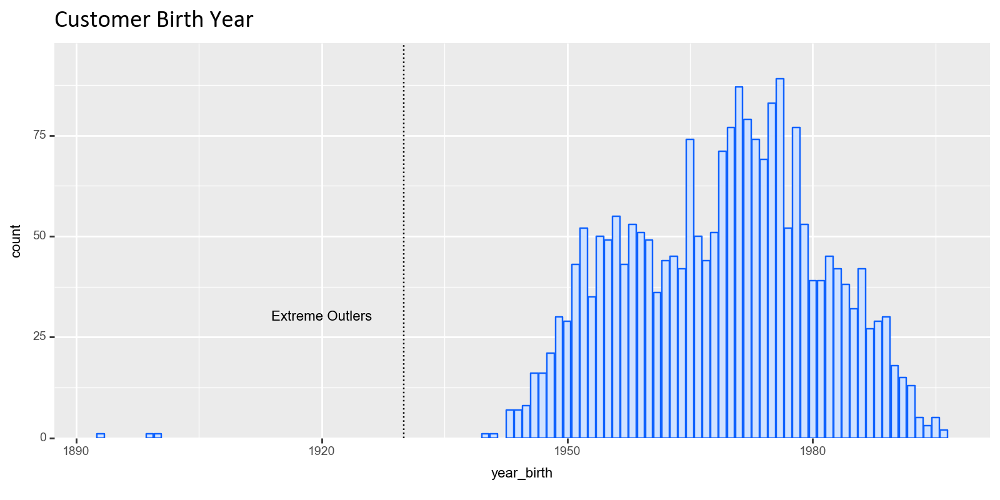

In [11]:
# create birth year count col plot
year_birth_plot = ggplot(year_birth_df, aes('year_birth', 'count'))\
    + geom_col(color=COLOR['dark_blue'], fill=COLOR['light_blue'])\
    + scale_y_continuous(expand=(0, 0, 0.1, 0))\
    + theme(figure_size=(8, 4), **custom_font_theme_params)\
    + labs(title='Customer Birth Year')\
    + geom_vline(xintercept=1930, linetype='dotted')\
    + annotate('text', x=1920, y=30, label='Extreme Outlers', size=8)

year_birth_plot.draw()

#### Education & Income

In [12]:
# set education as categorical dtype (for plotting)
education_df = customer_df.copy()[['id', 'education']]
education_df['education'] = pd.Categorical(
    education_df['education'],
    categories=education_df.education.value_counts().reset_index().education.tolist(),
    ordered=True)

In [13]:
def proportion_per_category(x, count):
    df = pd.DataFrame({"x": x, "count": count})
    prop = df["count"] / df.groupby("x")["count"].transform("sum")
    return prop

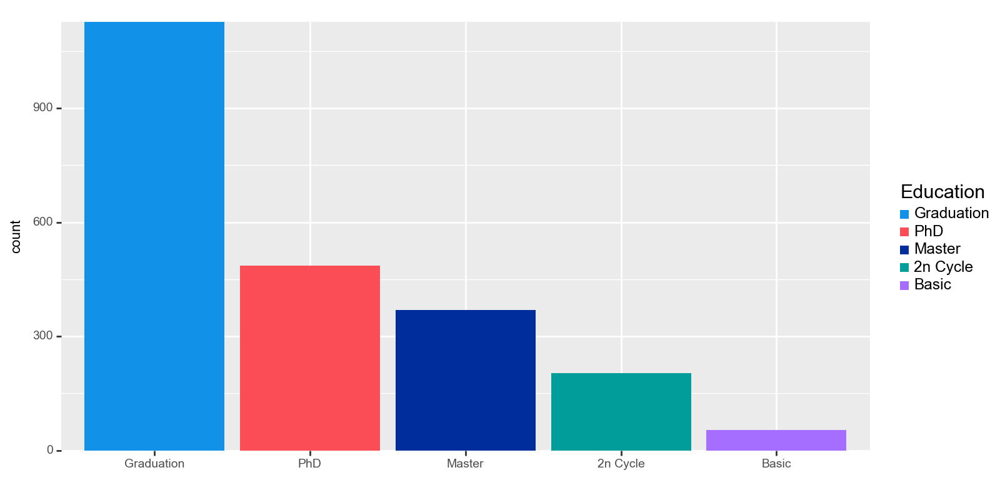

In [14]:
# create education plot
education_bar_plot = ggplot(education_df)\
    + geom_bar(aes('factor(education)', fill='factor(education)'))\
    + scale_fill_manual(CAT_COLOR)\
    + scale_y_continuous(expand=(0, 0))\
    + labs(fill='Education', x='')\
    + theme(legend_key_size=5, **custom_font_theme_params, figure_size=(8, 4))

education_bar_plot.draw()

Majority of the individuals in our data have graduated college labelled as "Graduation" or Undergrad Degree. It's interesting how majority 
of our data is followed by PhD and Master Degree, this implies that our customers are fairly well-off and have/had better education opportunities.

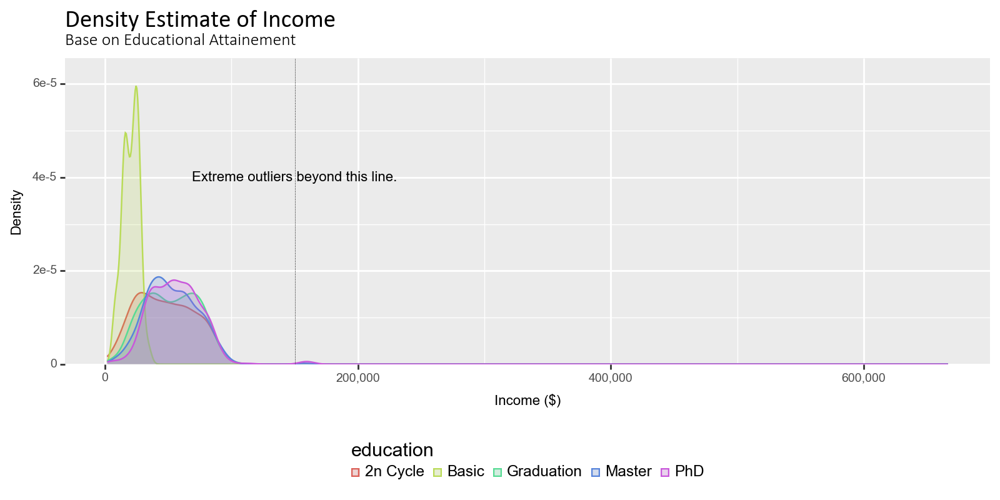

In [15]:
# create income kernel density plot
customer_income_density_plot = ggplot(customer_df, aes('income', color='education', fill='education'))\
    + geom_density(alpha=.2)\
    + scale_y_continuous(expand=(0, 0, 0.1, 0))\
    + scale_x_continuous(labels=comma_format())\
    + theme(figure_size=(8, 4), **custom_font_theme_params, legend_position='bottom', legend_key_size=5)\
    + labs(x='Income ($)', y='Density', title='Density Estimate of Income', subtitle='Base on Educational Attainement')\
    + geom_vline(xintercept=150_000, size=.2, linetype='dotted')\
    + annotate('text', x=150_000, y=4e-5, label='Extreme outliers beyond this line.', size=8)

customer_income_density_plot.draw()

In [16]:
# # create average by education
# education_income_df = customer_df.groupby(['education']).agg({'income': 'mean'}).reset_index()
# education_income_plot = ggplot(education_income_df, aes('education', 'income'))\
#     + geom_col(width=0.03, fill=COLOR['mid_blue'])\
#     + geom_point(size=3, fill=COLOR['dark_blue'], color=COLOR['dark_blue'])\
#     + theme(figure_size=(8, 4), **custom_font_theme_params)\
#     + scale_y_continuous(labels=comma_format())\
#     + coord_flip()\
#     + labs(x='Education', y='Income ($)', title='Average Income by Education')

# education_income_plot.draw()

### Distribution & Normality

#### Shaprio-Wilk Test for Normality and Outlier Detection

In [17]:
# select numerical features from our customer dataframe
normality_test_df = customer_df\
    .select_dtypes('number')\
    .drop(['id', 'year_birth'], axis=1)

In [18]:
# use pingouin normality test (shapiro-wilk test)
normality_test_df_results = pg.normality(normality_test_df)

# format boolean 
normality_test_df_results.style.applymap(
    lambda x: f"""background-color: {COLOR['dark_blue']}""" if x \
        else f"""background-color: {COLOR['light_blue']}""", subset='normal'
)

,W,pval,normal
income,0.777053,0.000000,False
kidhome,0.676591,0.000000,False
teenhome,0.693879,0.000000,False
recency,0.954077,0.000000,False
mnt_wines,0.838144,0.000000,False
mnt_fruits,0.689081,0.000000,False
mnt_meat_products,0.729818,0.000000,False
mnt_fish_products,0.708592,0.000000,False
mnt_sweet_products,0.686749,0.000000,False
mnt_gold_prods,0.767089,0.000000,False


## Feature Engineering
---

#### Birth Year (Numerical Type) to Generation (Discrete)

In [19]:
# create a mapping function for our year-birth column
def generation_mapping(year: int) -> str:
    """
    A mapper for customer dataframe `year_birth` column.
    :returns: A descriptive label for year of birth base on birth generation.
    :return type: String
    """
    
    if 1883 <= year <= 1900:
        return 'Lost Generation'
        
    elif 1901 <= year <= 1924:
        return 'Greatest Generation'
        
    elif 1925 <= year <= 1945:
        return 'Silent Generation'
        
    elif 1946 <= year <= 1964:
        return 'Baby Boomer Generation'
        
    elif 1965 <= year <= 1980:
        return 'Generation X'
        
    elif 1981 <= year <= 1996:
        return 'Generation Y'

In [20]:
# transform birth generation to our own mapping
customer_df['birth_generation'] = customer_df['year_birth'].apply(generation_mapping)

#### Reduce cardinality for Marital Status & Education

In [21]:
# check for the unique values in marital status
customer_df.marital_status.unique()

array(['Single', 'Together', 'Married', 'Divorced', 'Widow', 'Alone',
       'Absurd', 'YOLO'], dtype=object)

In [22]:
# select non-formal and low frequency values by getting their index
index_to_drop = customer_df[customer_df.marital_status.isin(['Alone', 'Absurd', 'YOLO'])].index

# drop them directly to our customer dataframe
customer_df = customer_df.drop(index_to_drop)

In [23]:
# check unique again for education
customer_df.education.unique()

array(['Graduation', 'PhD', 'Master', 'Basic', '2n Cycle'], dtype=object)

In [24]:
# replace 2n Cycle with Master
customer_df['education'] = customer_df.education.str.replace('2n Cycle', 'Master')

#### Correlation of Amount & Number of purchases

In [25]:
# select columns with col names beginning with mnt and num
amount_freq_df = pd.concat([
    customer_df.select_columns('mnt*'),
    customer_df.select_columns('num*')
], axis=1)

In [26]:
# perform a pearson correlation and style the table
amount_freq_df.corr().style.background_gradient(cmap='Greys')

,mnt_wines,mnt_fruits,mnt_meat_products,mnt_fish_products,mnt_sweet_products,mnt_gold_prods,num_deals_purchases,num_web_purchases,num_catalog_purchases,num_store_purchases,num_web_visits_month
mnt_wines,1.000000,0.389796,0.563280,0.401224,0.386592,0.388495,0.010935,0.542329,0.635971,0.641923,-0.321499
mnt_fruits,0.389796,1.000000,0.543087,0.593576,0.567206,0.390749,-0.130890,0.298755,0.486289,0.461837,-0.416787
mnt_meat_products,0.563280,0.543087,1.000000,0.569113,0.524427,0.351037,-0.121840,0.295549,0.724777,0.479785,-0.539437
mnt_fish_products,0.401224,0.593576,0.569113,1.000000,0.581886,0.417971,-0.138438,0.297245,0.532599,0.461211,-0.443629
mnt_sweet_products,0.386592,0.567206,0.524427,0.581886,1.000000,0.370665,-0.118873,0.350203,0.490794,0.448730,-0.423269
mnt_gold_prods,0.388495,0.390749,0.351037,0.417971,0.370665,1.000000,0.050443,0.424964,0.435097,0.382533,-0.247789
num_deals_purchases,0.010935,-0.130890,-0.121840,-0.138438,-0.118873,0.050443,1.000000,0.232351,-0.006633,0.069128,0.346363
num_web_purchases,0.542329,0.298755,0.295549,0.297245,0.350203,0.424964,0.232351,1.000000,0.380889,0.503246,-0.058635
num_catalog_purchases,0.635971,0.486289,0.724777,0.532599,0.490794,0.435097,-0.006633,0.380889,1.000000,0.519089,-0.519027
num_store_purchases,0.641923,0.461837,0.479785,0.461211,0.448730,0.382533,0.069128,0.503246,0.519089,1.000000,-0.429250


#### Change Education "Graduation" to "Undergrad"

In [27]:
# Graduation is vague so we replace it with undergraduate (college)
customer_df['education'] = customer_df.education.str.replace('Graduation', 'Undergrad')

#### Remove Income Outliers

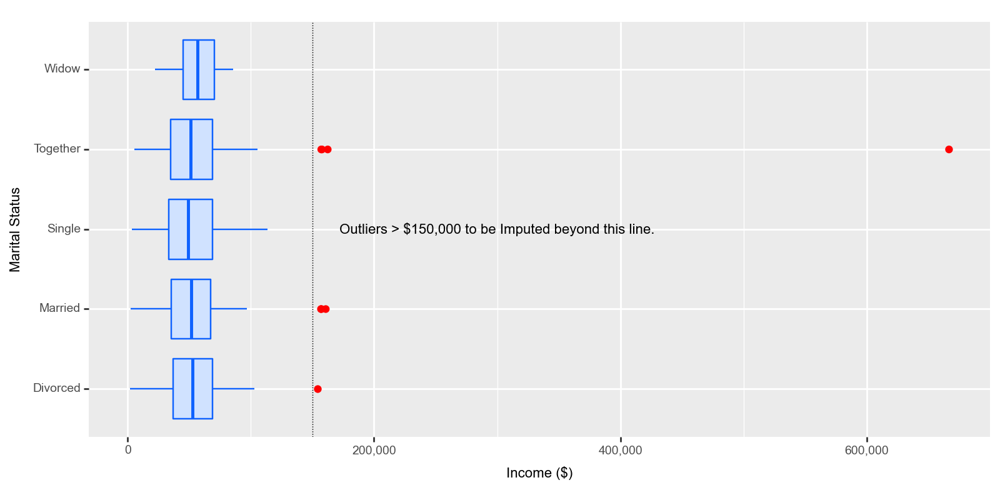

In [28]:
# create a boxplot to see outliers
outliers_plot = ggplot(customer_df, aes('marital_status', 'income'))\
    + geom_boxplot(fill=COLOR['light_blue'], color=COLOR['dark_blue'], outlier_color='red')\
    + geom_hline(yintercept=150_000, size=.3, linetype='dotted')\
    + annotate('text', x=3, y=300_000, size=8, label='Outliers > $150,000 to be Imputed beyond this line.')\
    + coord_flip()\
    + theme(**custom_font_theme_params, figure_size=(8, 4))\
    + labs(x='Marital Status', y='Income ($)')\
    + scale_y_continuous(labels=comma_format())

outliers_plot.draw()

In [29]:
# we get the index of values greater or equal to 150,000
index_to_drop = customer_df[customer_df.income >= 150_000].index

# drop these index directly to our customer dataframe
customer_df = customer_df.drop(index_to_drop)

## Pipeline
---

Let's create a pipeline for our data. The pipeline will include StandardScaler, OneHotEncoder, Imputer, and added datetime features by utilizing feature-engine which has a scikit-learn wrapper.

In [30]:
# exclude these features in our training
exclude_cols = ['id', 'year_birth']

# drop the columns and convert dt feature before transformation
train_df = customer_df\
    .drop(exclude_cols, axis=1)\
    .to_datetime('dt_customer', format='%d-%m-%Y')

In [31]:
# select categorical feature names to be encoded
to_encode_features = train_df.select_dtypes('object').columns.tolist()

In [32]:
# Prepare transformers for pipeline
# Standard Scaler for scaling our numerical features
scaler = SklearnTransformerWrapper(StandardScaler())

# Encoder for our categorical Features
ohe = OneHotEncoder(variables=to_encode_features)

# Expand on customer date of acquiantance.
dtf = DatetimeFeatures(
    variables='dt_customer',
    features_to_extract=['month', 'year', 'day_of_year'])

# Imputer for our income feature
mmi = MeanMedianImputer(variables='income', imputation_method='median')

In [33]:
# create pipeline along with naming each step
pipe = Pipeline([
    ('dt-feature', dtf),
    ('median-imputer', mmi),
    ('scaler', scaler),
    ('ohe', ohe)
]).fit(train_df)

In [34]:
# transform our train dataframe
output_df = pipe.transform(train_df)
output_df.head(10)

,income,kidhome,teenhome,recency,mnt_wines,mnt_fruits,mnt_meat_products,mnt_fish_products,mnt_sweet_products,mnt_gold_prods,num_deals_purchases,num_web_purchases,num_catalog_purchases,num_store_purchases,num_web_visits_month,...,dt_customer_day_of_year,education_Undergrad,education_PhD,education_Master,education_Basic,marital_status_Single,marital_status_Together,marital_status_Married,marital_status_Divorced,marital_status_Widow,birth_generation_Baby Boomer Generation,birth_generation_Generation X,birth_generation_Generation Y,birth_generation_Silent Generation,birth_generation_Lost Generation
0,0.315984,-0.825313,-0.930734,0.304899,0.978943,1.547525,1.733637,2.466263,1.470077,0.844670,0.362118,1.408817,2.636134,-0.557708,0.691368,...,0.623293,1,0,0,0,1,0,0,0,0,1,0,0,0,0
1,-0.256214,1.031432,0.905155,-0.386042,-0.872326,-0.637370,-0.726574,-0.652442,-0.633534,-0.731194,-0.165872,-1.116191,-0.585629,-1.173997,-0.137231,...,-1.073332,1,0,0,0,1,0,0,0,0,1,0,0,0,0
2,0.969736,-0.825313,-0.930734,-0.800607,0.358887,0.568090,-0.175305,1.347198,-0.149945,-0.039351,-0.693861,1.408817,-0.227655,1.291162,-0.551530,...,0.482689,1,0,0,0,0,1,0,0,0,0,1,0,0,0
3,-1.211882,1.031432,-0.930734,-0.800607,-0.872326,-0.562028,-0.662791,-0.505680,-0.585175,-0.750412,-0.165872,-0.755476,-0.943602,-0.557708,0.277069,...,-1.317046,1,0,0,0,0,1,0,0,0,0,0,1,0,0
4,0.323504,1.031432,-0.930734,1.548594,-0.391708,0.417407,-0.216308,0.154752,-0.004868,-0.558233,1.418097,0.326670,0.130319,0.058582,-0.137231,...,-1.523266,0,1,0,0,0,0,1,0,0,0,0,1,0,0
5,0.528241,-0.825313,0.905155,-1.146078,0.637764,0.392293,-0.307427,-0.689133,0.357823,-0.577451,-0.165872,0.687386,0.488292,1.291162,0.277069,...,0.660787,0,0,1,0,0,1,0,0,0,0,1,0,0,0
6,0.194548,-0.825313,0.905155,-0.524230,-0.207768,0.969909,-0.006735,0.228133,0.527079,-0.327619,0.890107,1.048101,0.130319,0.366727,0.277069,...,1.279446,1,0,0,0,0,0,0,1,0,0,1,0,0,0
7,-0.881585,1.031432,-0.930734,-0.593325,-0.679485,-0.411346,-0.498777,-0.634097,-0.633534,-0.404490,-0.165872,-0.034045,-0.943602,-0.557708,1.105667,...,-0.501541,0,1,0,0,0,0,1,0,0,0,0,1,0,0
8,-1.032130,1.031432,-0.930734,-1.042437,-0.863425,-0.662483,-0.644567,-0.634097,-0.585175,-0.808065,-0.693861,-0.394760,-0.943602,-1.173997,1.519967,...,-0.229706,0,1,0,0,0,1,0,0,0,0,1,0,0,0
9,-2.230620,1.031432,0.905155,0.650370,-0.821890,-0.662483,-0.726574,-0.670788,-0.633534,-0.596669,-0.693861,-1.116191,-0.943602,-1.790287,6.077260,...,-1.026464,0,1,0,0,0,1,0,0,0,1,0,0,0,0


## Clustering

1. Distortion Score Elbow for KMeans Clustering, this method uses within-cluster-sum of squared errors. $\text{WSS} = \sum_{k=1}^K \sum_{i \in C_k} \| x_i - \mu_k \|^2$
The graphical represnetation below is provided by yellowbrick module. The indicators for choosing the appropriate number of clusters is to pinpoint the the distortion score before it starts to slope.
This method can be subjective thus, we have to apply another method which is silhouette score.

2. The silhouett score can be determined by $S = \frac{1}{N} \sum_{i=1}^N s(i)$ where s(i) which is the silhouette score for each data point be $s(i) = \frac{b(i) - a(i)}{\max\{a(i), b(i)\}}$
where a(i) is the average distance between datapoints in a cluster. and b(i) is the minimum distance between datapoints in a cluster. As we examine the our silhouette chart below the highest silhouette score is found on the k=7 clusters. However, 7 clusters will be too many for our business case. So the deciding factor will be k=6 and k=2. With similar coefficients around .31. 

3. Let's then compare the similarities of k=6 and k=2 using intercluster range, the visualization gives us an estimation of how similar the clusters are for 6 and 2 as they are overlapping.

4. Lastly, let's see how many clusters we have for hierarchical clustering, the clustering will depend on the linkage method. For 'ward' method we're getting 2 clusters.

In [35]:
# create kmeans model with clusters of 6
km = KMeans(n_clusters=6, random_state=25)

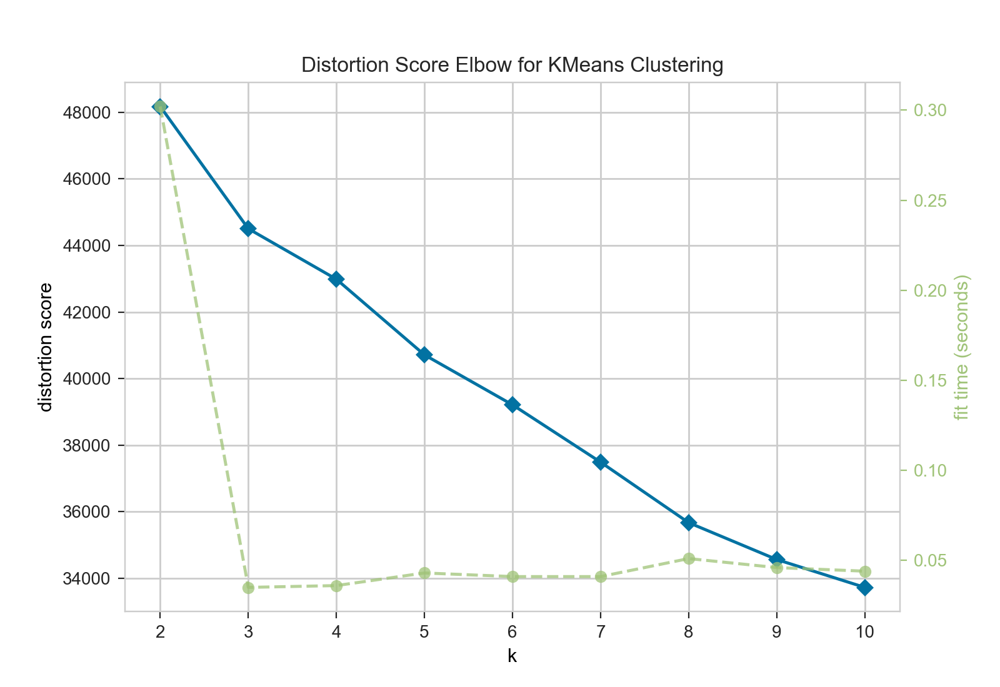

In [36]:
# visualize using elbow method which uses Within-Cluster-Sum of Squared Errors (WSS)
visualizer = KElbowVisualizer(km).fit(output_df)
visualizer.show();

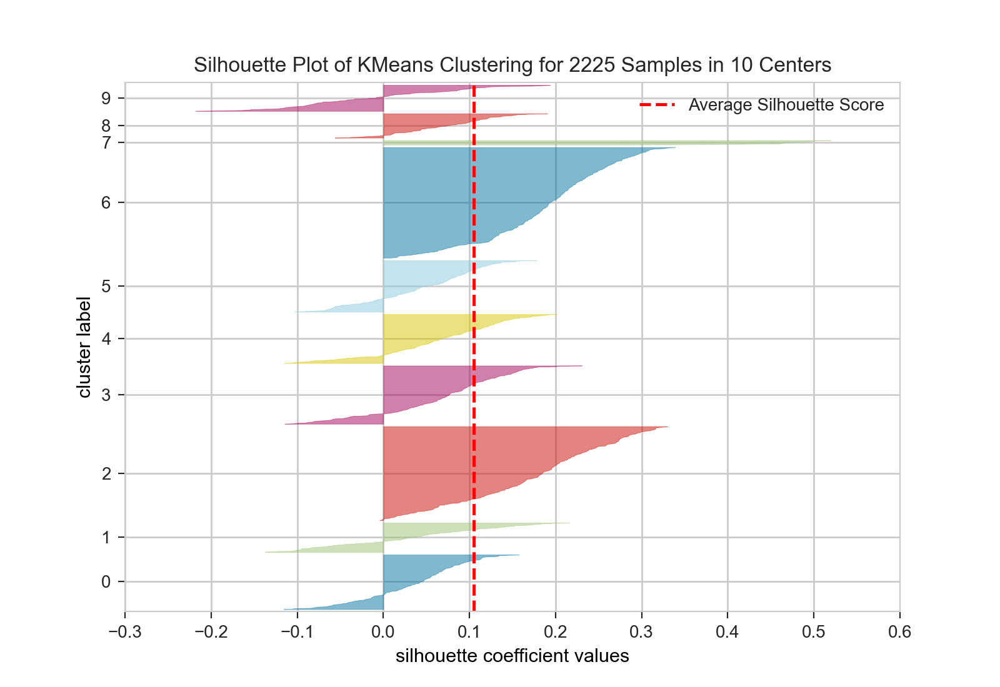

In [37]:
# Visualize silhouette score
sil = SilhouetteVisualizer(km, colors='yellowbrick').fit(output_df)
sil.show();

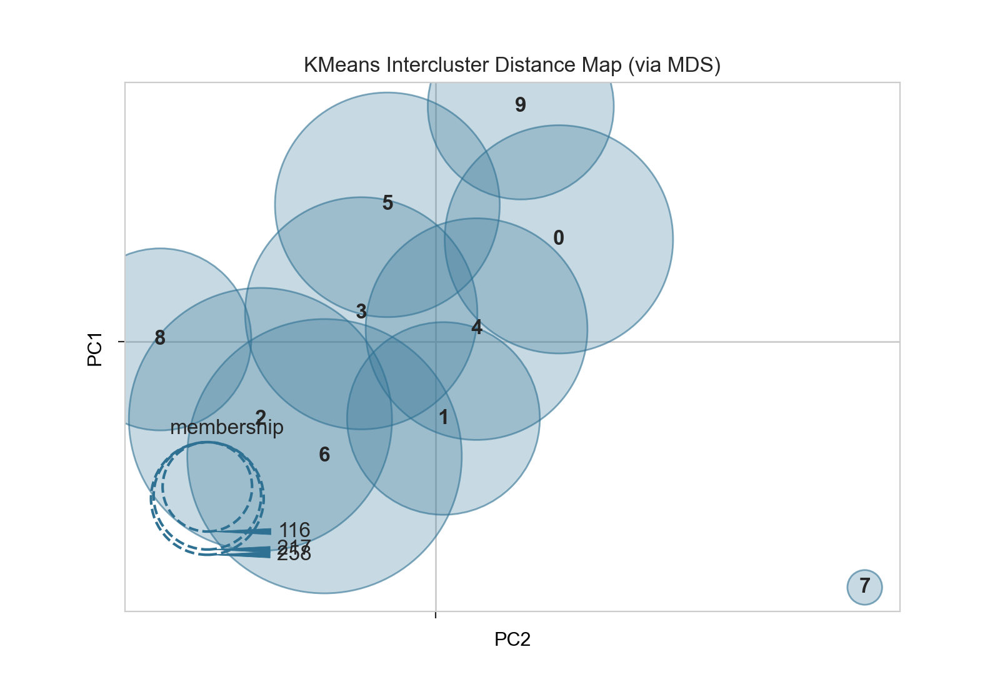

In [38]:
# visualize intercluster distance
icd_viz = InterclusterDistance(km)
icd_viz.fit(output_df)
icd_viz.show();

#### Hierarchical Clustering

In [39]:
# create linkage
h_cluster = linkage(output_df, method='ward')

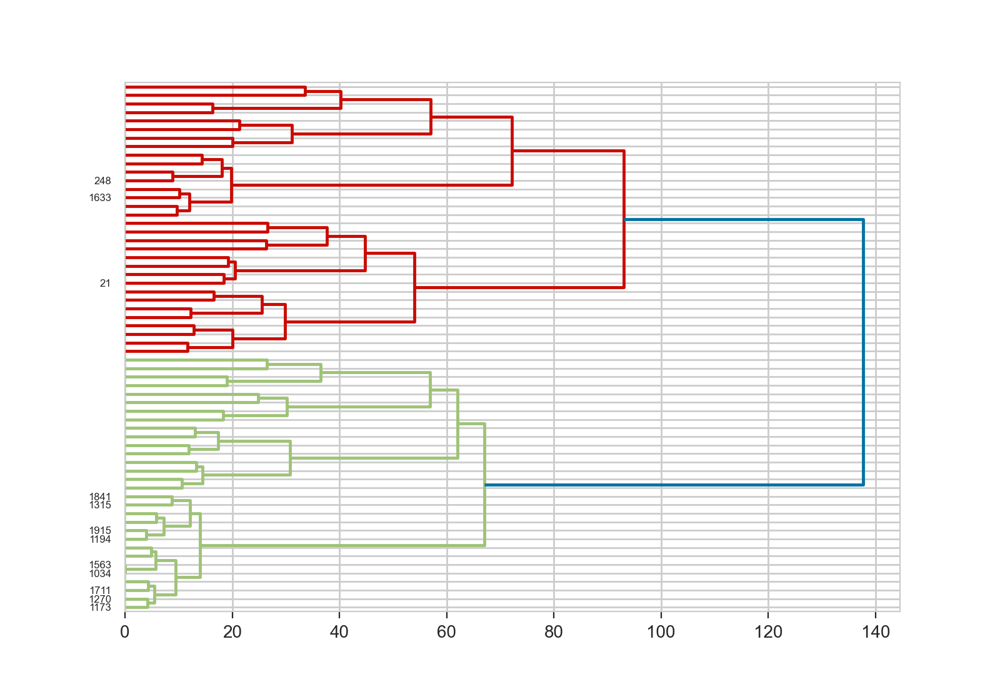

In [40]:
# visualize using dendogram
dendrogram(h_cluster, show_leaf_counts=False, orientation='right', truncate_mode='level', p=5)
plt.show()

#### Segmentation

In [41]:
class PatchGrid:
    """
    Naive Class to Plot our features in a grid.
    """
    def __init__(self, patchwork_list: list, grid: tuple):
        
        self.patchwork = patchwork_list
        self.size = len(patchwork_list)
        self.structure = None
        self.plotted_structure = None
        self.grid = grid
        self._post_init()

    def _post_init(self):
        self.structure_grid()
        self.insert_plots_to_structure()

    def structure_grid(self) -> None:
        """
        Create a structured syntax of a patch based on patchworklib. 
        :return type: None
        """
        
        self.structure = ""
        row_composition = []
        row: int = self.grid[0]
        col: int = self.grid[1]
        total_rows = 1
        
        # check if total grid is divisible with no remainder
        # if self.size % 2 == 0:

        # for loop on the number of rows needed based on given grid
        for nrows in np.arange(row, dtype=int):

            # a concatendated string that follows the syntax for patching using pipes and slash
            _row: str = "(" + (self.structure + '{p}|' * row).rstrip('|') + ")" + "/"

            # a boolean state to check if we are in the end of the row
            end_of_row: bool = total_rows == self.grid[0]
            
            if not end_of_row:
                row_composition.append([_row])                    
            else:
                # if we are at the end we remove '/' as it is not needed
                row_composition.append([_row.rstrip('/')])
            
            total_rows += 1

        # flatten our structure since it's currently nested list
        flatten_structure: list = [i for i in flatten(row_composition)]

        # join elements in a list into a single line of string
        string_flatten_structure: str = ''.join(flatten_structure)

        # assign it to our class attribute
        self.structure: str = string_flatten_structure

    def insert_plots_to_structure(self):
        series_structure = pd.Series([self.structure], name='structure').str.split('}', expand=True)
        patches = []
        
        for count, i in enumerate(series_structure.iloc[0]):
            patch_string = i.replace('p', f'self.patchwork[{count}]').replace('{', '')
            patches.append(patch_string)
            
        # clean_patches = [i + '}' for i in patches]
        self.plotted_structure = ''.join(patches)
        
    def show(self):
        return eval(f'{self.plotted_structure}')

In [42]:
def make_ggplot_patch(dataframe: pd.DataFrame, cols_to_pair: list[str])\
    -> PatchGrid:
        
    ggplot_point_plots = []
    for i in pairwise(cols_to_pair):
        p = ggplot(dataframe)\
            + geom_point(aes(i[0], i[1], fill='factor(segments)'), alpha=.3)\
            + labs(fill='Segments')\
            + scale_fill_manual(CAT_COLOR)\
            + theme(
                **custom_font_theme_params, 
                legend_title=element_text(size=8),
                axis_line=element_line(color='black'),
                panel_grid_minor=element_line(color='gray', size=.2),
                panel_grid_major=element_line(color='gray', size=.2),)
        
        patch = pw.load_ggplot(p, figsize=(4, 2))
        ggplot_point_plots.append(patch)
    
    patch_grid = PatchGrid(ggplot_point_plots, grid=(4, 4))
    return patch_grid

In [43]:
def save_cluster_to_excel(train_df: pd.DataFrame, n_clusters: int, save_path: str) -> None:
    """
    Save a specific n_clusters of interest (k) as an excel file. 
    """
    clusters_range = np.flip(np.arange(n_clusters))
    
    def run_save(df, sheet_name, save, clusters=clusters_range) -> None:
        """
        Gets the statistical profile of per segment and save it as a sheet in a .xlsx file.
        """
        
        for i in clusters:

            # create a filtered dataframe
            to_save_df = df.filter_on(f'segments == {i}').describe()

            # Use pandas built-in excel writer and save the dataframe as sheets.
            try:
                
                with pd.ExcelWriter(save_path, mode='a', if_sheet_exists='overlay') as writer:
                    to_save_df.to_excel(writer, sheet_name=f'{sheet_name}_{i}', index=True)
    
            # creates an empty dataframe if new file
            except FileNotFoundError:
            
                with pd.ExcelWriter(save_path) as writer:   
                    
                    empty_dataframe=pd.DataFrame()
                    empty_dataframe.to_excel(writer, sheet_name=f'kmeans_clusters_of_{np.max(clusters)}')
                    
            finally:
                
                with pd.ExcelWriter(save_path, mode='a', if_sheet_exists='overlay') as writer:
                    to_save_df.to_excel(writer, sheet_name=f'{sheet_name}_{i}', index=True)

            

    # Instantiate KMeans
    km_clusters6 = KMeans(n_clusters=n_clusters, random_state=25)

    # Fit the output dataframe
    labels = km_clusters6.fit_predict(train_df)

    # Add labels to dataframe
    seg_df = output_df.copy()
    seg_df['segments'] = labels

    # Select features base on context
    demographic = seg_df.select_columns(
        'income', 
        'kidhome',
        'teenhome',
        'education*', 
        'marital_status*', 
        'birth_generation*',
        'segments'
    )

    purchase = seg_df.select_columns(
        'mnt*', 
        'num*',
        'accepted*',
        'segments'
    )

    # save to excel
    run_save(df=demographic, sheet_name='Demographic_Cluster', save=save_path)
    run_save(df=purchase, sheet_name='Purchase_Cluster', save=save_path)

In [44]:
save_cluster_to_excel(
    train_df=output_df,
    n_clusters=4,
    save_path='k4_customer_segmentation.xlsx',
)

In [45]:
save_cluster_to_excel(
    train_df=output_df,
    n_clusters=2,
    save_path='k2_customer_segmentation.xlsx',
)

#### Segmentation (k=2)

** Note: The process here contains the same process with saving the statistical description clusters to excel.

In [ ]:
km_clusters6 = KMeans(n_clusters=2, random_state=25)
labels = km_clusters6.fit_predict(output_df)

seg_df = output_df.copy()
seg_df['segments'] = labels

demographic = seg_df.select_columns(
    'income', 
    'kidhome',
    'teenhome',
    'education*', 
    'marital_status*', 
    'birth_generation*',
    'segments'
)

In [46]:
demographic.filter_on('segments == 0').describe()

,income,kidhome,teenhome,education_Undergrad,education_PhD,education_Master,education_Basic,marital_status_Single,marital_status_Together,marital_status_Married,marital_status_Divorced,marital_status_Widow,birth_generation_Baby Boomer Generation,birth_generation_Generation X,birth_generation_Generation Y,birth_generation_Silent Generation,birth_generation_Lost Generation,segments
count,881.000000,881.000000,881.000000,881.000000,881.000000,881.000000,881.000000,881.000000,881.000000,881.000000,881.000000,881.000000,881.000000,881.000000,881.000000,881.000000,881.000000,881.0
mean,0.950027,-0.703075,-0.147199,0.531215,0.232690,0.234960,0.001135,0.214529,0.257662,0.368899,0.114642,0.044268,0.405221,0.414302,0.155505,0.023837,0.001135,0.0
std,0.581204,0.469146,0.981517,0.499308,0.422786,0.424215,0.033691,0.410728,0.437595,0.482781,0.318771,0.205806,0.491214,0.492881,0.362591,0.152626,0.033691,0.0
min,-2.385920,-0.825313,-0.930734,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
25%,0.592670,-0.825313,-0.930734,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
50%,0.961052,-0.825313,-0.930734,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
75%,1.358786,-0.825313,0.905155,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.0
max,3.013278,2.888177,2.741044,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.0


In [47]:
demographic.filter_on('segments == 1').describe()

,income,kidhome,teenhome,education_Undergrad,education_PhD,education_Master,education_Basic,marital_status_Single,marital_status_Together,marital_status_Married,marital_status_Divorced,marital_status_Widow,birth_generation_Baby Boomer Generation,birth_generation_Generation X,birth_generation_Generation Y,birth_generation_Silent Generation,birth_generation_Lost Generation,segments
count,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,1344.0
mean,-0.622748,0.460870,0.096490,0.486607,0.203869,0.270089,0.039435,0.216518,0.259673,0.398810,0.096726,0.028274,0.296875,0.517113,0.182292,0.002232,0.001488,1.0
std,0.674704,0.987772,1.000977,0.500007,0.403023,0.444171,0.194699,0.412024,0.438618,0.489836,0.295695,0.165816,0.457051,0.499893,0.386228,0.047210,0.038561,0.0
min,-2.420706,-0.825313,-0.930734,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0
25%,-1.119252,-0.825313,-0.930734,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0
50%,-0.633547,1.031432,0.905155,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.0
75%,-0.112849,1.031432,0.905155,1.000000,0.000000,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.0
max,1.335207,2.888177,2.741044,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.0


In [48]:
demographic_cols = demographic.columns.tolist()
demographic_patch_grid = make_ggplot_patch(
    demographic, 
    demographic_cols, 
)

# demographic_patch_grid.show()

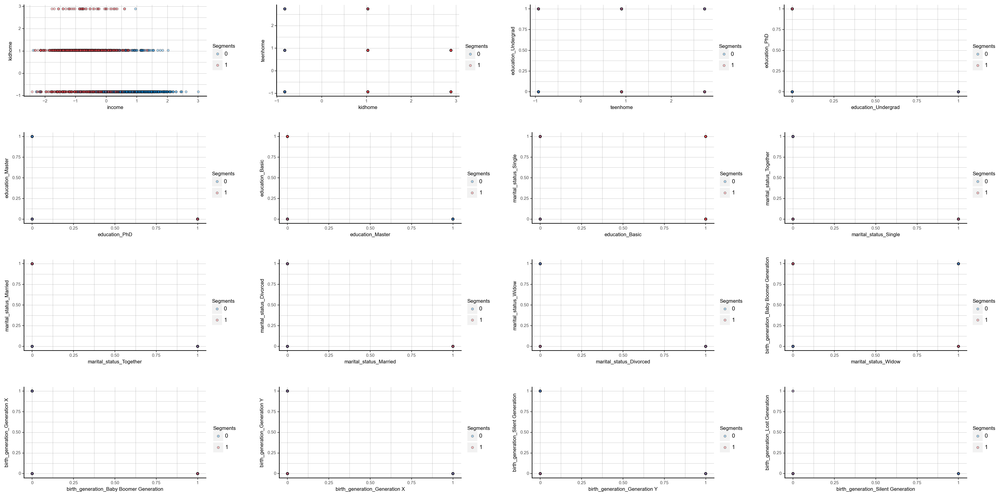

In [49]:
demographic_patch_grid.show()

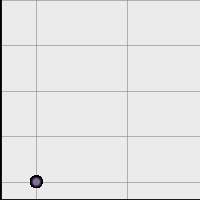

In [50]:
demographic_patch_grid.show().savefig('demographic_pattern_per_segment.png')

#### Purchasing Behavior

In [ ]:
purchase = seg_df.select_columns(
    'mnt*', 
    'num*',
    'accepted*',
    'segments'
)

purchase_0 = purchase.filter_on('segments == 0')
purchase_1 = purchase.filter_on('segments == 1')

In [53]:
purchase_0.describe()

,mnt_wines,mnt_fruits,mnt_meat_products,mnt_fish_products,mnt_sweet_products,mnt_gold_prods,num_deals_purchases,num_web_purchases,num_catalog_purchases,num_store_purchases,num_web_visits_month,accepted_cmp3,accepted_cmp4,accepted_cmp5,accepted_cmp1,accepted_cmp2,segments
count,881.000000,881.000000,881.000000,881.000000,881.000000,881.000000,881.000000,881.000000,881.000000,881.000000,881.000000,881.000000,881.000000,881.000000,881.000000,881.000000,881.0
mean,0.907545,0.751696,0.888558,0.773142,0.750403,0.621952,-0.186848,0.616553,0.949066,0.860248,-0.681322,0.034317,0.227786,0.427495,0.367408,0.158664,0.0
std,0.929614,1.215120,1.079230,1.182973,1.215421,1.178130,0.934314,0.978614,0.902254,0.887462,0.881469,1.054955,1.297988,1.491817,1.474144,1.521866,0.0
min,-0.901993,-0.662483,-0.740242,-0.689133,-0.657713,-0.846501,-1.221851,-1.476907,-0.943602,-1.790287,-2.208728,-0.280226,-0.284863,-0.280226,-0.262076,-0.116908,0.0
25%,0.207581,-0.160209,0.020601,-0.157118,-0.174125,-0.269965,-0.693861,-0.034045,0.130319,0.058582,-1.380129,-0.280226,-0.284863,-0.280226,-0.262076,-0.116908,0.0
50%,0.765335,0.392293,0.612874,0.466623,0.382002,0.229699,-0.693861,0.326670,0.846266,0.983017,-0.965830,-0.280226,-0.284863,-0.280226,-0.262076,-0.116908,0.0
75%,1.533730,1.421957,1.519507,1.493961,1.494256,1.286680,-0.165872,1.048101,1.562213,1.599306,-0.137231,-0.280226,-0.284863,-0.280226,-0.262076,-0.116908,0.0
max,3.524437,4.335150,7.105096,4.062307,5.701478,6.110360,6.697993,8.262409,9.079660,2.215596,1.519967,3.568553,3.510463,3.568553,3.815683,8.553752,0.0


In [54]:
purchase_1.describe()

,mnt_wines,mnt_fruits,mnt_meat_products,mnt_fish_products,mnt_sweet_products,mnt_gold_prods,num_deals_purchases,num_web_purchases,num_catalog_purchases,num_store_purchases,num_web_visits_month,accepted_cmp3,accepted_cmp4,accepted_cmp5,accepted_cmp1,accepted_cmp2,segments
count,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,1.344000e+03,1344.000000,1344.000000,1344.0
mean,-0.594901,-0.492741,-0.582455,-0.506799,-0.491893,-0.407693,0.122480,-0.404154,-0.622119,-0.563898,0.446611,-0.022495,-0.149315,-2.802257e-01,-0.240838,-0.104005,1.0
std,0.442732,0.274970,0.190024,0.301016,0.277923,0.571985,1.023147,0.785103,0.380963,0.580517,0.802182,0.962399,0.704587,5.553181e-17,0.293629,0.334353,0.0
min,-0.904960,-0.662483,-0.753910,-0.689133,-0.657713,-0.846501,-1.221851,-1.476907,-0.943602,-1.790287,-1.794428,-0.280226,-0.284863,-2.802257e-01,-0.262076,-0.116908,1.0
25%,-0.872326,-0.637370,-0.712906,-0.652442,-0.657713,-0.750412,-0.693861,-1.116191,-0.943602,-0.865852,-0.137231,-0.280226,-0.284863,-2.802257e-01,-0.262076,-0.116908,1.0
50%,-0.801123,-0.587142,-0.660513,-0.615752,-0.585175,-0.615887,-0.165872,-0.755476,-0.585629,-0.865852,0.691368,-0.280226,-0.284863,-2.802257e-01,-0.262076,-0.116908,1.0
75%,-0.474036,-0.461574,-0.507889,-0.468989,-0.464278,-0.308401,0.362118,-0.034045,-0.585629,-0.249563,1.105667,-0.280226,-0.284863,-2.802257e-01,-0.262076,-0.116908,1.0
max,2.355527,1.924231,0.398745,2.594681,3.138458,4.188575,6.697993,2.490963,1.204240,1.907451,6.077260,3.568553,3.510463,-2.802257e-01,3.815683,8.553752,1.0


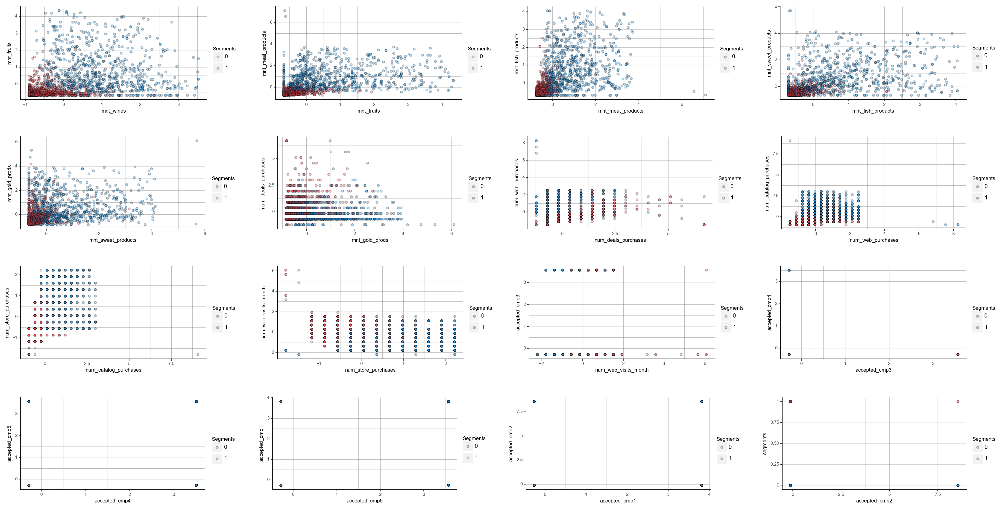

In [56]:
purchase_cols = purchase.columns.tolist()
purchase_patch_grid = make_ggplot_patch(
    purchase, 
    purchase_cols, 
)

purchase_patch_grid.show()

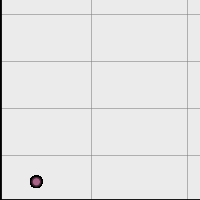

In [57]:
purchase_patch_grid.show().savefig('purchase_pattern_per_segment.png')

### Visualization of k=4
---

In [51]:
km_clusters6 = KMeans(n_clusters=4, random_state=25)
labels = km_clusters6.fit_predict(output_df)

seg_df = output_df.copy()
seg_df['segments'] = labels

demographic = seg_df.select_columns(
    'income', 
    'kidhome',
    'teenhome',
    'education*', 
    'marital_status*', 
    'birth_generation*',
    'segments'
)

purchase = seg_df.select_columns(
    'mnt*', 
    'num*',
    'accepted*',
    'segments'
)

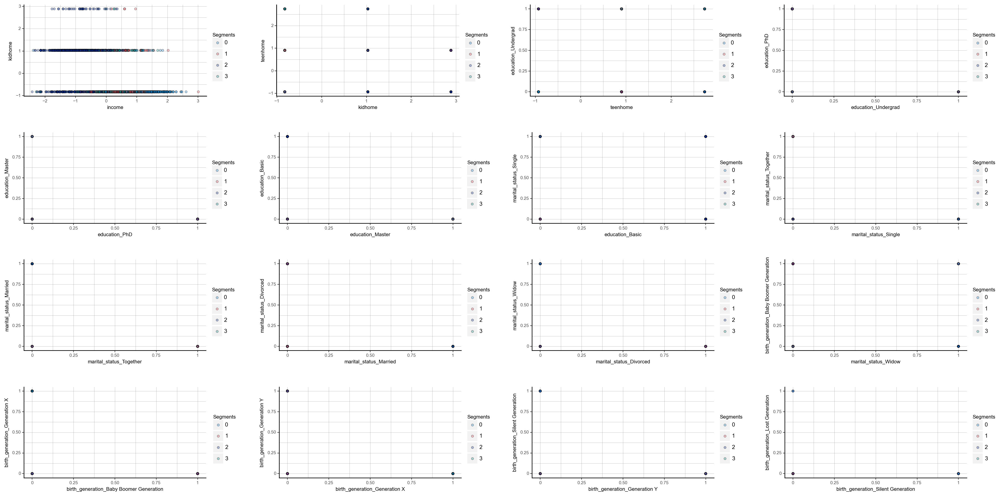

In [49]:
demographic_cols = demographic.columns.tolist()
demographic_patch_grid = make_ggplot_patch(
    demographic, 
    demographic_cols, 
)

demographic_patch_grid.show()

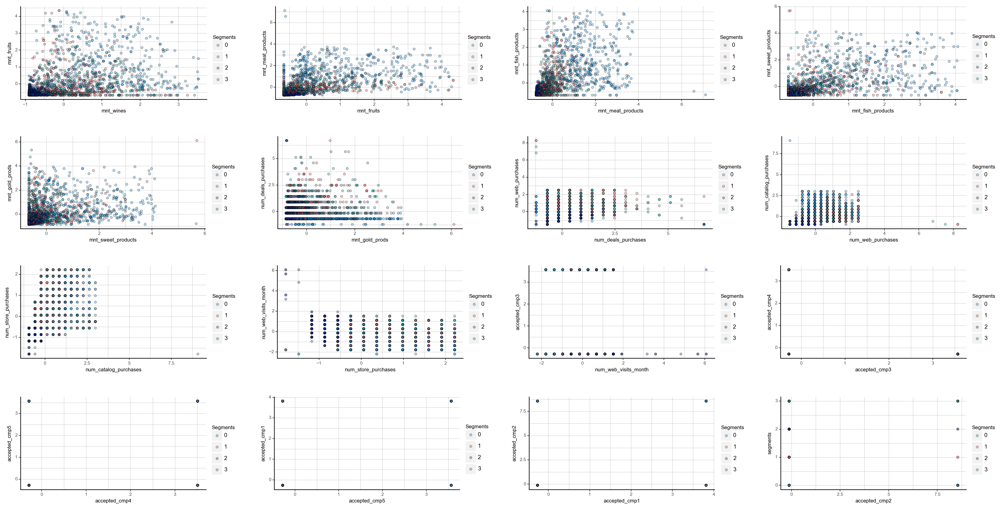

In [52]:
purchase_cols = purchase.columns.tolist()
purchase_patch_grid = make_ggplot_patch(
    purchase, 
    purchase_cols, 
)

purchase_patch_grid.show()